# 1. Data Source and Contents

Q.1 Why does it makes sense to discretize columns for this problem?
Decision trees  often perform better with categorical data because they are based on splitting data into branches based on conditions.

Q.2 What might be the issues (if any) if we DID NOT discretize the columns.
We can end up with a model that is too complex with too many splits, as the alogrithm will try to split the data into as many branches as possible. This can lead to overfitting and poor generalization to new data.

In [1]:
#importing libraries
%pip install pandas
%pip install numpy
%pip install seaborn
%pip install matplotlib
# %pip install sklearn
%pip install graphviz
%pip install six
%pip install pydotplus
%pip install IPython
%pip install scikit-learn
%pip install scipy


import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import export_graphviz
import graphviz
from six import StringIO
from IPython.display import Image
import pydotplus
from sklearn.datasets import load_iris
from sklearn import tree
from sklearn import datasets, metrics, model_selection, svm
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report, roc_curve, auc, roc_auc_score, RocCurveDisplay

Note: you may need to restart the kernel to use updated packages.


Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [2]:
# Kevin

#loading in data
df = pd.read_csv("https://github.com/ArinB/MSBA-CA-03-Decision-Trees/blob/master/census_data.csv?raw=true")

# 2. Data Quality Analysis (DQA)

In [3]:
#checking data
df.head()

,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag,y
0,b. 31-40,b. Mid - Low,b. Mid,c. > 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,train,0
1,a. 0-30,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,train,0
2,b. 31-40,a. Low,b. Mid,a. = 0,c. High,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,train,0
3,b. 31-40,a. Low,c. High,a. = 0,b. Mid,a. 0-8,a. Low,b. income,e. 40-55,train,0
4,b. 31-40,e. High,c. High,a. = 0,a. Low,c. 13,c. Bachelors,b. income,b. 26-30 & 71-100,train,0


In [4]:
# removing first letter and the period from hours_per_week_bin,	occupation_bin,	msr_bin, capital_gl_bin, race_sex_bin, education_num_bin, education_bin, workclass_bin, age_bin
df['hours_per_week_bin'] = df['hours_per_week_bin'].str[2:]
df['occupation_bin'] = df['occupation_bin'].str[2:]
df['msr_bin'] = df['msr_bin'].str[2:]
df['capital_gl_bin'] = df['capital_gl_bin'].str[2:]
df['race_sex_bin'] = df['race_sex_bin'].str[2:]
df['education_num_bin'] = df['education_num_bin'].str[2:]
df['education_bin'] = df['education_bin'].str[2:]
df['workclass_bin'] = df['workclass_bin'].str[2:]
df['age_bin'] = df['age_bin'].str[2:]

df.head()

,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag,y
0,31-40,Mid - Low,Mid,> 0,High,13,Bachelors,income,36-40 & 56-60,train,0
1,0-30,High,High,= 0,High,13,Bachelors,income,40-55,train,0
2,31-40,Low,Mid,= 0,High,9-12,Mid,income,36-40 & 56-60,train,0
3,31-40,Low,High,= 0,Mid,0-8,Low,income,40-55,train,0
4,31-40,High,High,= 0,Low,13,Bachelors,income,26-30 & 71-100,train,0


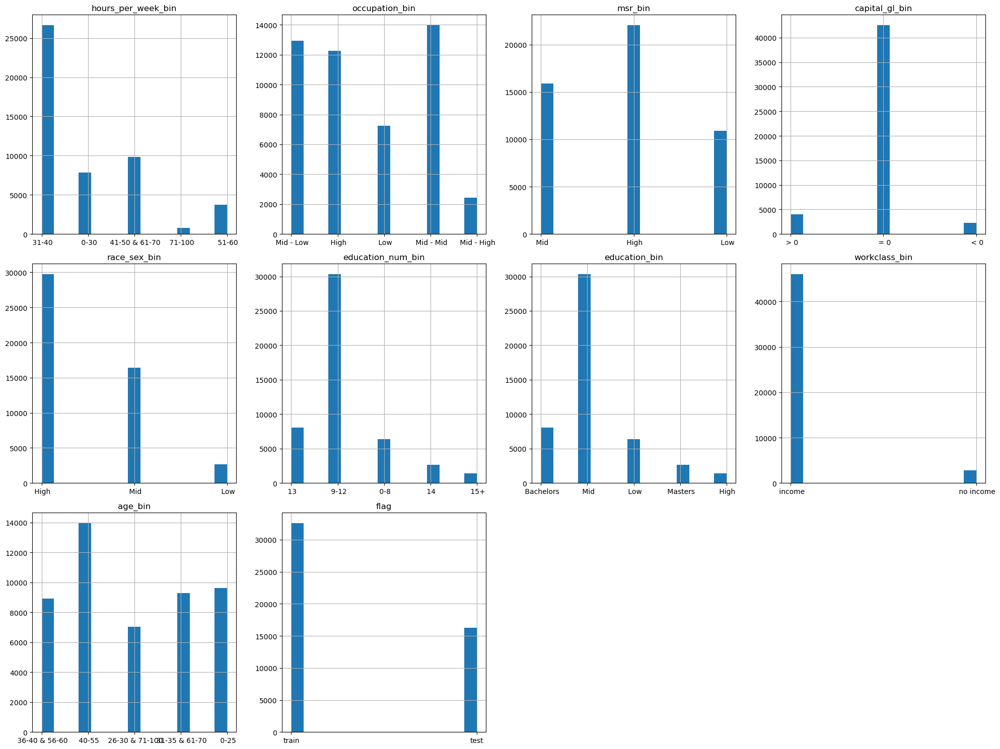

In [5]:
# Create some visualizations to understand the data
# Plot histograms for each of the columns since they are binned/discrete
df_first_10_columns = df.iloc[:, :10]

# Plot histograms for each of these columns
plt.figure(figsize=(20, 15))

for i, column in enumerate(df_first_10_columns.columns):
    plt.subplot(3, 4, i+1) # arranging plots in 3 rows and 4 columns
    df_first_10_columns[column].hist(bins=15)
    plt.title(column)

plt.tight_layout()
plt.show()

In [6]:
# Function to calculate continuous feature statistics
def continuous_stats(df):
    cont_features = df.select_dtypes(include=['int64', 'float64'])
    stats = pd.DataFrame()
    stats['Count'] = cont_features.count()
    stats['% Miss.'] = cont_features.isnull().mean() * 100
    stats['Card.'] = cont_features.nunique()
    stats['Min'] = cont_features.min()
    stats['1st Qrt.'] = cont_features.quantile(0.25)
    stats['Mean'] = cont_features.mean()
    stats['Median'] = cont_features.median()
    stats['3rd Qrt.'] = cont_features.quantile(0.75)
    stats['Max'] = cont_features.max()
    stats['Std. Dev.'] = cont_features.std()
    return stats


def categorical_stats(df):
    cate_features = df.select_dtypes(include=['object', 'category'])
    stats = pd.DataFrame()
    # Calculate the required statistics
    stats['Count'] = cate_features.count()
    stats['% Miss.'] = cate_features.isnull().mean() * 100
    stats['Card.'] = cate_features.nunique()

    # Mode and Mode Frequency
    mode_df = cate_features.mode().iloc[0]
    mode_freq = cate_features.apply(lambda x: (x == mode_df[x.name]).sum())
    stats['Mode'] = mode_df
    stats['Mode Freq.'] = mode_freq
    stats['Mode %'] = 100 * mode_freq / cate_features.count()

    # Second Mode and Second Mode Frequency
    def second_mode(x):
        if x.nunique() > 1: 
            return x.value_counts().index[1], x.value_counts().iloc[1]
        else: 
            return None, 0
    
    second_modes = cate_features.apply(second_mode)
    stats['2nd Mode'] = second_modes.apply(lambda x: x[0])
    stats['2nd Mode Freq.'] = second_modes.apply(lambda x: x[1])
    stats['2nd Mode %'] = 100 * stats['2nd Mode Freq.'] / cate_features.count()

    
    stats.fillna('-', inplace=True)

    return stats


categorical_report = categorical_stats(df)
continuous_report = continuous_stats(df)



print(f"Continuous Features")
print(continuous_report)
print(f"-----------------------------------------------------------------------------")
print(f"-----------------------------------------------------------------------------")
print(f"-----------------------------------------------------------------------------")
print(f"Categorical Features")
print(categorical_report)


Continuous Features
   Count  % Miss.  Card.  Min  1st Qrt.      Mean  Median  3rd Qrt.  Max  \
y  48842      0.0      2    0       0.0  0.239282     0.0       0.0    1   

   Std. Dev.  
y   0.426649  
-----------------------------------------------------------------------------
-----------------------------------------------------------------------------
-----------------------------------------------------------------------------
Categorical Features
                    Count  % Miss.  Card.        Mode  Mode Freq.     Mode %  \
hours_per_week_bin  48842      0.0      5       31-40       26639  54.541174   
occupation_bin      48842      0.0      5   Mid - Mid       13971  28.604480   
msr_bin             48842      0.0      3        High       22047  45.139429   
capital_gl_bin      48842      0.0      3         = 0       42525  87.066459   
race_sex_bin        48842      0.0      3        High       29737  60.884075   
education_num_bin   48842      0.0      5        9-12       30

# 3. Build Decision Tree Classifier Models

In [7]:
# creating train and test datasets
df_train = df[df['flag'] == 'train']
df_test = df[df['flag'] == 'test']

features_cols = ['hours_per_week_bin',	'occupation_bin',	'msr_bin', 'capital_gl_bin', 'race_sex_bin', 'education_num_bin', 'education_bin', 'workclass_bin', 'age_bin']
x_train = df_train[features_cols]
y_train = df_train['y']

x_test = df_test[features_cols]
y_test = df_test['y']

In [8]:
# encoding the dataset
x_train = pd.get_dummies(x_train, columns = features_cols, drop_first=True)
x_test = pd.get_dummies(x_test, columns = features_cols, drop_first=True)

In [9]:
#syntax to use classifer is shown below
dtree = DecisionTreeClassifier(max_depth=10, random_state=101, max_features=None, min_samples_leaf=15)

dtree.fit(x_train, y_train)
y_pred = dtree.predict(x_test)

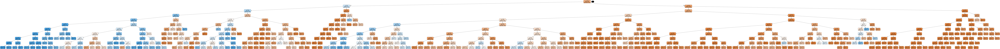

In [10]:
# visualizing the decision tree
dot_data = StringIO()
tree.export_graphviz(dtree, out_file=dot_data, filled=True, rounded=True, special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  

# Create a png file so we can visualize the tree/zoom in on the tree.
graph.write_png('census.png')
Image(graph.create_png())

# 4. Evaluate Decision Tree Performance

[[11501   934]
 [ 1653  2193]]
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
          Predicted 0  Predicted 1
Actual 0        11501          934
Actual 1         1653         2193
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

     

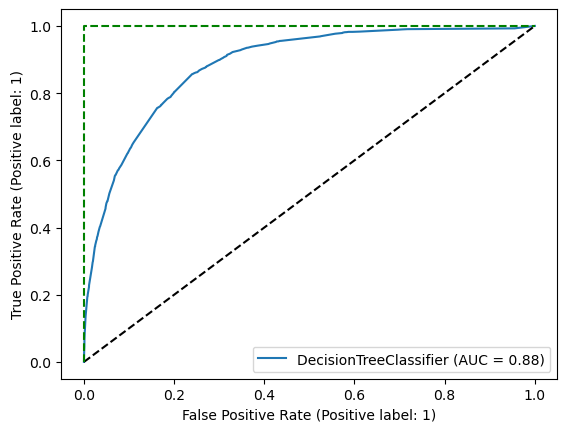

In [11]:
# creating confusion matrix
print(confusion_matrix(y_test, y_pred))
print("-"*200)
print("-"*200)

# Label the confusion matrix
conf_matrix = pd.DataFrame(data=confusion_matrix(y_test, y_pred), columns=['Predicted 0', 'Predicted 1'], index=['Actual 0', 'Actual 1'])
print(conf_matrix)
print("-"*200)
print("-"*200)


# The below code is commented out to double check the accuracy, precision, recall and f1 score.

# # calculating accuracy, precsiion, recall and f1 score
# accuracy = accuracy_score(y_test, y_pred)
# precision = precision_score(y_test, y_pred)
# recall = recall_score(y_test, y_pred)
# f1 = f1_score(y_test, y_pred)


# print(f"Accuracy: {accuracy:.2f}")
# print(f"Precision: {precision:.2f}")
# print(f"Recall: {recall:.2f}")
# print(f"F1: {f1:.2f}")

# creating classification report
print(classification_report(y_test, y_pred))
    
# plotting roc curve
y_score = dtree.predict_proba(x_test)[:,1]
auc = roc_auc_score(y_test, y_score)
print(f"AUC: {auc:.4f}")

# plotting the roc auc curve
RocCurveDisplay.from_estimator(dtree, x_test, y_test)       
# plot the random line
plt.plot([0, 1], [0, 1], 'k--')
# plot the perfect model
plt.plot([0, 0, 1], [0, 1, 1], 'g--')             

# 5. Tune Decision Tree Performance

In [12]:
# Mason

# tryig out the 4 hyperparameters
dtree_tune = tree.DecisionTreeClassifier(criterion='entropy', max_features = 'log2', min_samples_split= 10, min_samples_leaf = 10)
dtree_tune = dtree_tune.fit(x_train, y_train)
y_pred_tune = dtree_tune.predict(x_test)

# classification report
print(classification_report(y_test, y_pred_tune))

              precision    recall  f1-score   support

           0       0.86      0.93      0.90     12435
           1       0.71      0.51      0.59      3846

    accuracy                           0.83     16281
   macro avg       0.78      0.72      0.74     16281
weighted avg       0.82      0.83      0.82     16281



Q.3 Decision Tree Hyper-parameter variation vs. performance

Split Criteria - Gini is usually used for impurity and entropy is used for information gain.

Max Features - The # of features to consider. Limiting this can lead to a more diversed tree.

Min Sample Leaf - Specifying the min number of samples required to be at each node. Setting too high can cause underfitting and vice versa.

Max Depth - Controls the max depth of tree. Deeper tree can model more complex situation but might cause overfitting and vice versa.

In [13]:
# setting up each run...
criteria = ['gini', 'entropy']
min_samples_leaf1 = [5, 10, 15, 20, 25, 30, 35, 40]
max_features1 = [None, 0.3 , 0.4, 0.5, 0.6, 0.7, 0.8]            
max_depth1 = [2, 4, 6, 8, 10, 12, 14, 16]

In [14]:
# run 1
results1 = []
for criterion in criteria:
    model = DecisionTreeClassifier(criterion=criterion)
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    accuracy = np.mean(y_test == y_pred)
    results1.append(accuracy)

print(f'Gini, Entropy: {results1}')
print('--------------')
print(max(results1))   # just making it easier to see the best accuracy

Gini, Entropy: [0.8356980529451508, 0.8365579509858116]
--------------
0.8365579509858116


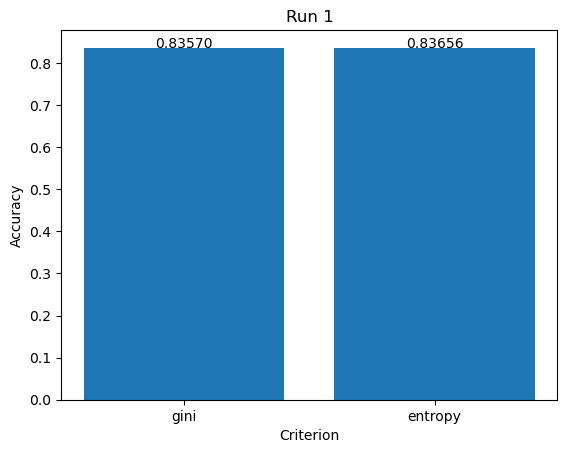

In [15]:
# run 1 plot
x = criteria  # X-axis points
y = results1  # Y-axis points

# plot bar chart with total accuracy figure above each bar
plt.bar(x, y)  # Plot the chart
for i in range(len(x)):
    plt.text(i, y[i], f'{y[i]:.5f}', ha='center') 
plt.xlabel('Criterion') 
plt.ylabel('Accuracy') 
plt.title('Run 1')  
plt.show()  

In [16]:
# run 2
results2 = []
for min_samples_leaf in min_samples_leaf1:
    model = DecisionTreeClassifier(min_samples_leaf=min_samples_leaf)
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    accuracy = np.mean(y_test == y_pred)
    results2.append(accuracy)

print(results2)
print('--------------')
print(max(results2))

[0.8392604876850316, 0.8414102327866838, 0.8422701308273448, 0.8426386585590566, 0.8417173392297771, 0.8415944966525398, 0.8427615011362939, 0.843252871445243]
--------------
0.843252871445243


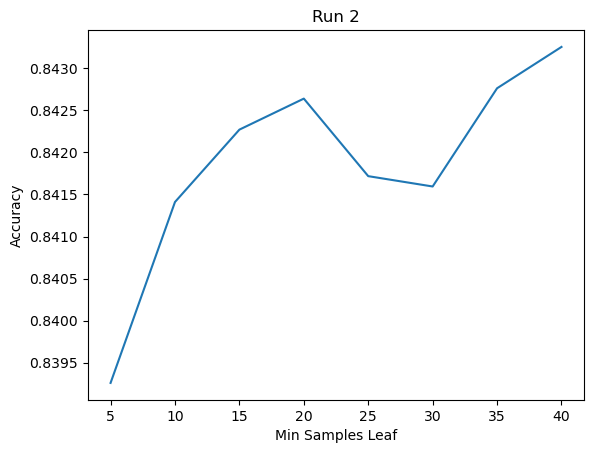

In [17]:
# run 2 plot
x = min_samples_leaf1  # X-axis points
y = results2  # Y-axis points
 
plt.plot(x, y)  # Plot the chart
plt.title('Run 2')
plt.xlabel('Min Samples Leaf')
plt.ylabel('Accuracy')
plt.show() 

In [18]:
# run 3
results3 = []
for max_features in max_features1:
    model = DecisionTreeClassifier(max_features=max_features, criterion = 'entropy', min_samples_leaf = 40)
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    accuracy = np.mean(y_test == y_pred)
    results3.append(accuracy)

print(results3)
print('--------------')
print(max(results3))

[0.843252871445243, 0.8363736871199557, 0.8386462747988452, 0.8392604876850316, 0.8405503347460229, 0.8407960199004975, 0.843744241754192]
--------------
0.843744241754192


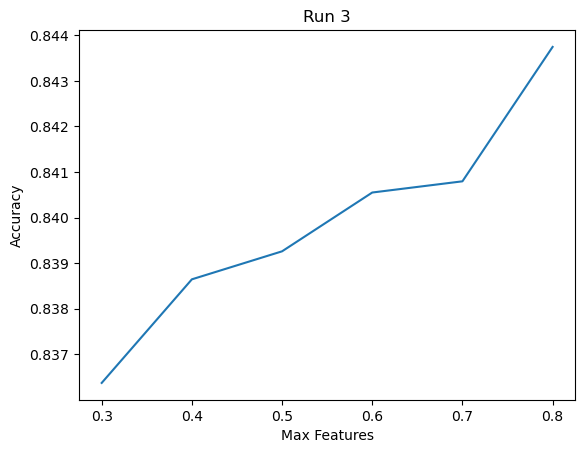

In [19]:
# run 3 plot
x = max_features1  # X-axis points
y = results3  # Y-axis points
 
plt.plot(x, y)  # Plot the chart
plt.title('Run 3')
plt.xlabel('Max Features')
plt.ylabel('Accuracy')
plt.show() 

In [20]:
# run 4
results4 = []
for max_depth in max_depth1:
    model = DecisionTreeClassifier(max_features = None, criterion = 'entropy', min_samples_leaf = 40, max_depth = max_depth)
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    accuracy = np.mean(y_test == y_pred)
    results4.append(accuracy)

print(results4)
print('--------------')
print(max(results4))

[0.7637737239727289, 0.80332903384313, 0.835145261347583, 0.8386462747988452, 0.8411031263435906, 0.8428843437135312, 0.843252871445243, 0.843252871445243]
--------------
0.843252871445243


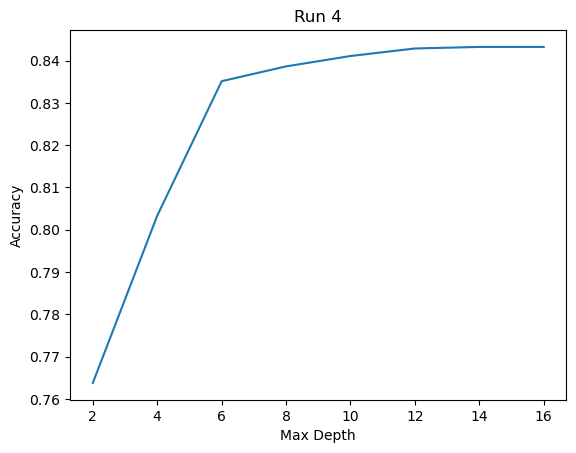

In [21]:
# run 4 plot
x = max_depth1  # X-axis points
y = results4  # Y-axis points
 
plt.plot(x, y)  # Plot the chart
plt.title('Run 4')
plt.xlabel('Max Depth')
plt.ylabel('Accuracy')
plt.show() 

Best combination is criteria = entropy, min sample leaf = 40, max feature = none, max depth = 14 OR 16

# 6. Visualize your best decision tree using graphviz

              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.71      0.56      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.75      0.76     16281
weighted avg       0.84      0.84      0.84     16281

AUC: 0.8896


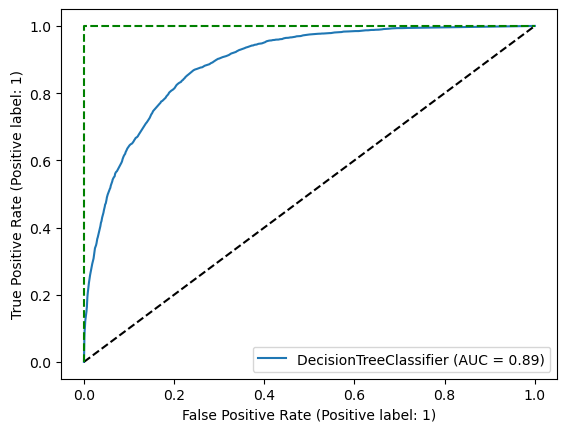

In [22]:
# Aaron

dtree_best = DecisionTreeClassifier(criterion='entropy', max_features = None, min_samples_leaf = 40, max_depth = 14)
dtree_best.fit(x_train, y_train)
y_pred_best = dtree_best.predict(x_test)

# classification report
print(classification_report(y_test, y_pred_best))   # higher f1 score too

# checking auc and plotting roc curve
y_score = dtree_best.predict_proba(x_test)[:,1]
auc = roc_auc_score(y_test, y_score)
print(f"AUC: {auc:.4f}")

RocCurveDisplay.from_estimator(dtree_best, x_test, y_test)    
# plot the random line
plt.plot([0, 1], [0, 1], 'k--')
# plot the perfect model
plt.plot([0, 0, 1], [0, 1, 1], 'g--')

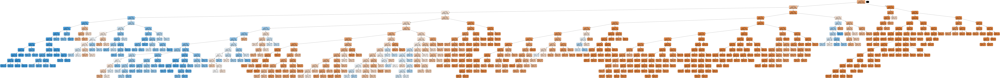

In [23]:
# visualizing the decision tree
dot_data = StringIO()
tree.export_graphviz(dtree_best, out_file=dot_data, filled=True, rounded=True, special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('census_best.png')
Image(graph.create_png())


# 7. Conclusion

Q.4 How long was your total run time to train the best model?

Very short, 0.1 second

Q.5 Did you find the BEST TREE?

Yes, we did. The best tree was found with the following hyperparameters: criterion='entropy', max_features = None, min_samples_leaf = 40, max_depth = 14

Q.6 Write your observations from the visualization of the best tree

The best tree looks more diverse compared to the first tree. It has a depth of 14, which is quite deep. This is likely due to the fact that we set the minimum number of samples required to be at a leaf node to be 40 meaning that the tree will continue to grow until each leaf has 40 samples. 

Q.7 Will this Tree “overfit”? (Hint: Is this tree “fully grown”)
                               
Yes it is likely to overfit because of the depth of the tree. It is not fully grown as it is still growing at a depth of 14.

# 8. Prediction using your "trained" decision tree model

In [24]:
#Aaron Cooking 

# Based on the Performance Tuning effort in the previous section, pick your BEST PERFORMING TREE. Now make prediction of a “new” individual’s Income Category ( <=50K, or >50K ) with the following information. Do this in your Notebook.
# • Hours Worked per Week = 48
# • Occupation Category = Mid - Low
# • Marriage Status & Relationships = High
# • Capital Gain = Yes
# • Race-Sex Group = Mid
# • Number of Years of Education = 12
# • Education Category = High
# • Work Class = Income
# • Age = 58


# Create a single record dataframe with the above values


# Perform binning and encoding on the prediction data


# Use the trained decision tree model to predict the income category


# Calculate the probability of the prediction being correct

# Hint: You have to create a single record dataframe with the above values with the EXACT same dataframe structure you have used for “training”. Then use the “model.predict()” object using this single-record dataframe. Also, note that you need to do exact same “binning” and “encoding” of the values above as per the original data file before you can use your dataframe for prediction.




# Q.8 What is the probability that your prediction for this person is correct?

In [25]:
# Define the features_cols variable with the correct column names
features_cols = ['hours_per_week_bin', 'occupation_bin', 'msr_bin', 'capital_gl_bin', 'race_sex_bin', 'education_num_bin', 'education_bin', 'workclass_bin', 'age_bin']

# preparing the data into dataframe
pred_df = {
    'hours_per_week_bin': '41-60',
    'occupation_bin': 'Mid - Low',
    'msr_bin': 'High',
    'capital_gl_bin': 'Yes',
    'race_sex_bin': 'Mid',
    'education_num_bin': '9-12',
    'education_bin': 'High',
    'workclass_bin': 'Income',
    'age_bin': '41-60'
}


# create a single record dataframe with the above values
prediction_df = pd.DataFrame([pred_df])

# encode the dataframe using the same encoding as the training data
prediction_df_encoded = pd.get_dummies(prediction_df, columns=features_cols, drop_first=True)

# ensure that the prediction dataframe has the same columns as the training dataframe
missing_cols = set(x_train.columns) - set(prediction_df_encoded.columns)
for col in missing_cols:
    prediction_df_encoded[col] = 0

# reorder the columns to match the order of the training dataframe
prediction_df_encoded = prediction_df_encoded[x_train.columns]

# use the trained decision tree model to predict the income category
prediction = dtree_best.predict(prediction_df_encoded)

# calculating the probability of the prediction being correct
probability = dtree_best.predict_proba(prediction_df_encoded)
print(f"The probability that the prediction for this person is correct is {probability[0][1]:.4f}")



The probability that the prediction for this person is correct is 0.9552
